In [6]:
import torch
import torchaudio
import torchaudio.functional as F

print(torch.__version__)
print(torchaudio.__version__)

import os
import random

from IPython.display import Audio
import matplotlib.pyplot as plt

1.13.1+cu117
0.13.1+cu117


In [7]:
print(os.getcwd())
print(os.listdir("../../../datasets/GTZAN/gtzan_genre/genres/blues"))

/home/oriol_colome_font_epidemicsound_/Master-Thesis-1/utils/positive generator/torchaudio tutorials
['blues.00052.wav', 'blues.00092.wav', 'blues.00093.wav', 'blues.00070.wav', 'blues.00076.wav', 'blues.00058.wav', 'blues.00098.wav', 'blues.00073.wav', 'blues.00038.wav', 'blues.00034.wav', 'blues.00069.wav', 'blues.00064.wav', 'blues.00057.wav', 'blues.00097.wav', 'blues.00007.wav', 'blues.00040.wav', 'blues.00049.wav', 'blues.00000.wav', 'blues.00027.wav', 'blues.00077.wav', 'blues.00075.wav', 'blues.00001.wav', 'blues.00063.wav', 'blues.00003.wav', 'blues.00035.wav', 'blues.00046.wav', 'blues.00082.wav', 'blues.00025.wav', 'blues.00024.wav', 'blues.00039.wav', 'blues.00088.wav', 'blues.00022.wav', 'blues.00081.wav', 'blues.00014.wav', 'blues.00026.wav', 'blues.00066.wav', 'blues.00044.wav', 'blues.00036.wav', 'blues.00094.wav', 'blues.00016.wav', 'blues.00051.wav', 'blues.00078.wav', 'blues.00020.wav', 'blues.00099.wav', 'blues.00031.wav', 'blues.00048.wav', 'blues.00002.wav', 'blue

In [8]:
root = '../../../datasets/GTZAN/gtzan_genre/genres/'
genres = ["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]

test_list = []
for genre in genres:
    song = random.choice(os.listdir(root + genre))
    audio, sr = torchaudio.load(os.path.join(root, genre, song))
    test_list.append(['test_audio_' + str(genre), audio, sr])

print(test_list)

[['test_audio_blues', tensor([[-0.1104, -0.1624, -0.1143,  ...,  0.1580,  0.0814,  0.0831]]), 22050], ['test_audio_classical', tensor([[-0.0230, -0.0298, -0.0196,  ...,  0.0015,  0.0030,  0.0017]]), 22050], ['test_audio_country', tensor([[ 0.1023,  0.0729, -0.0522,  ...,  0.0702,  0.0687,  0.0637]]), 22050], ['test_audio_disco', tensor([[0.0201, 0.0213, 0.0241,  ..., 0.3282, 0.1818, 0.0710]]), 22050], ['test_audio_hiphop', tensor([[-0.0265, -0.0086,  0.0248,  ...,  0.0738, -0.1415, -0.0008]]), 22050], ['test_audio_jazz', tensor([[-0.1553, -0.2125, -0.0863,  ..., -0.0490, -0.0569, -0.0592]]), 22050], ['test_audio_metal', tensor([[-0.0464, -0.0085,  0.0409,  ...,  0.4814,  0.4666,  0.3741]]), 22050], ['test_audio_pop', tensor([[0.1456, 0.0917, 0.0355,  ..., 0.0023, 0.0357, 0.0863]]), 22050], ['test_audio_reggae', tensor([[-0.0073, -0.0088, -0.0052,  ..., -0.0711, -0.0853, -0.0890]]), 22050], ['test_audio_rock', tensor([[-0.0377, -0.0473, -0.0237,  ...,  0.0076,  0.0219,  0.0288]]), 22050

In [9]:
for audio in test_list:
    print(audio[0])
    Audio(audio[1], rate=audio[2])

test_audio_blues
test_audio_classical
test_audio_country
test_audio_disco
test_audio_hiphop
test_audio_jazz
test_audio_metal
test_audio_pop
test_audio_reggae
test_audio_rock


In [10]:
def plot_waveform(waveform, sample_rate, title="Waveform", xlim=None):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sample_rate

    figure, axes = plt.subplots(num_channels, 1)
    if num_channels == 1:
        axes = [axes]
    for c in range(num_channels):
        axes[c].plot(time_axis, waveform[c], linewidth=1)
        axes[c].grid(True)
        if num_channels > 1:
            axes[c].set_ylabel(f"Channel {c+1}")
        if xlim:
            axes[c].set_xlim(xlim)
    figure.suptitle(title)
    plt.show(block=False)

In [11]:
def play_audio(waveform, sample_rate):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  if num_channels == 1:
    display(Audio(waveform[0], rate=sample_rate))
  elif num_channels == 2:
    display(Audio((waveform[0], waveform[1]), rate=sample_rate))
  else:
    raise ValueError("Waveform with more than 2 channels are not supported.")

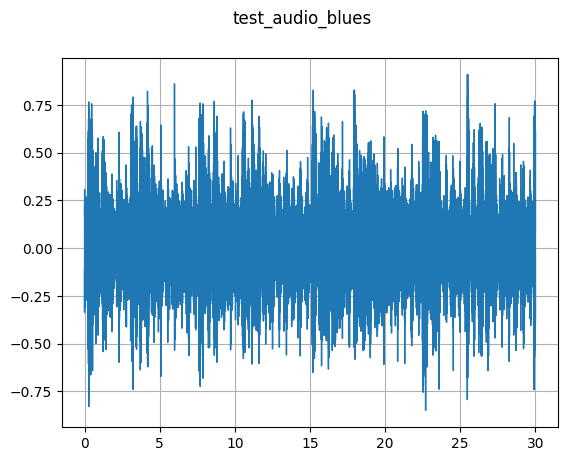

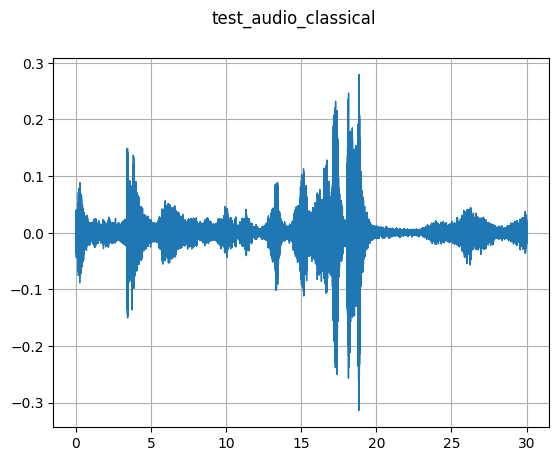

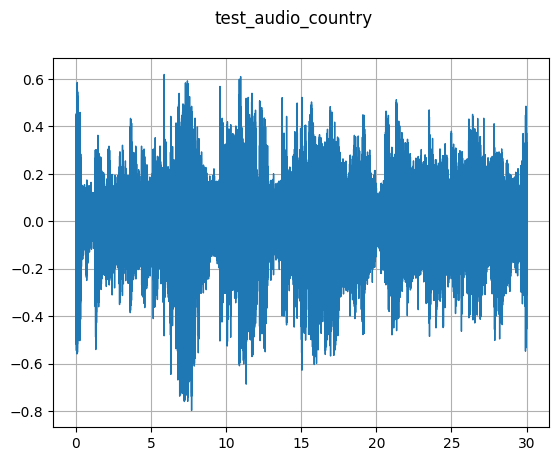

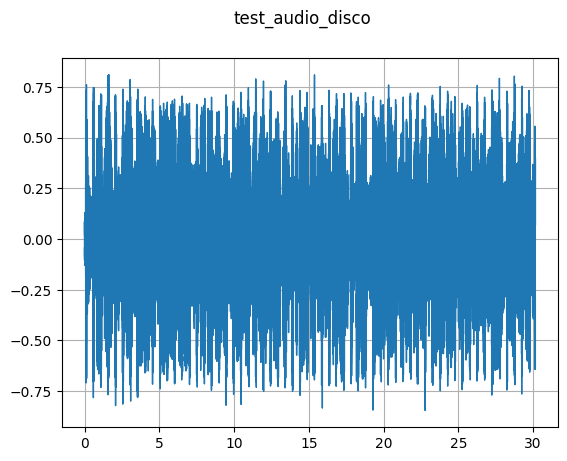

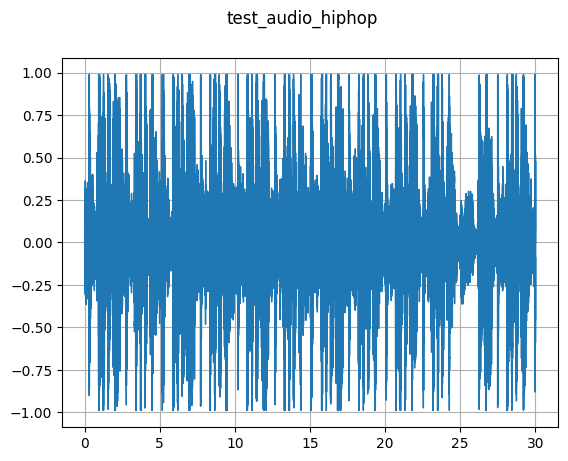

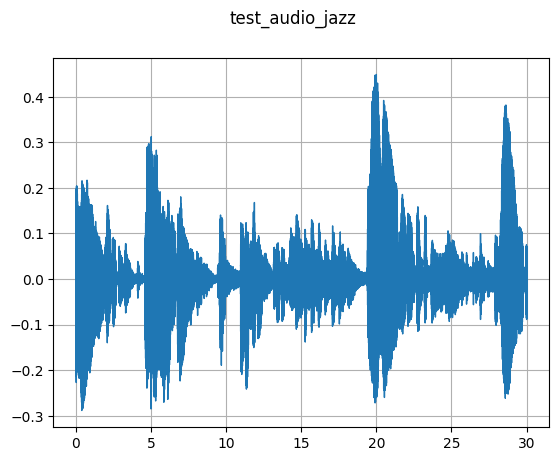

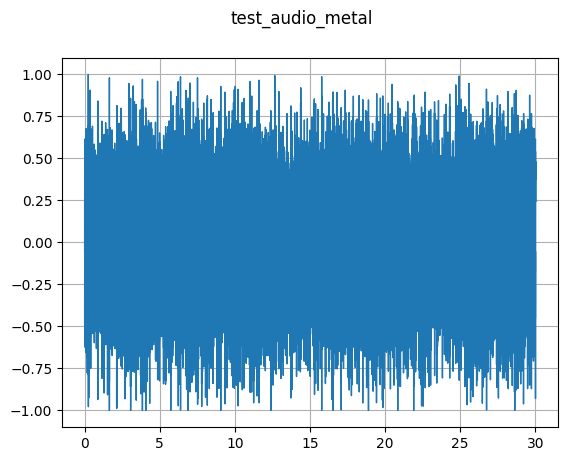

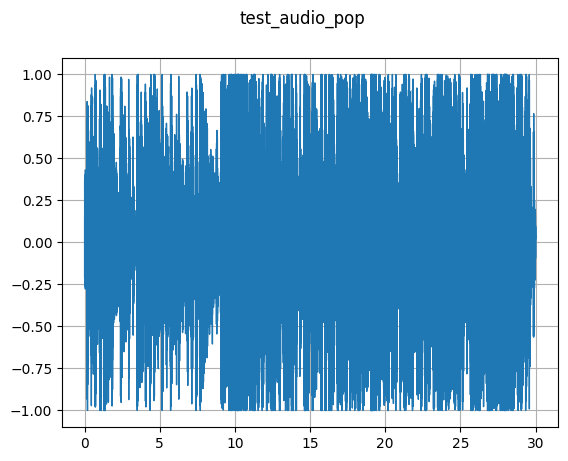

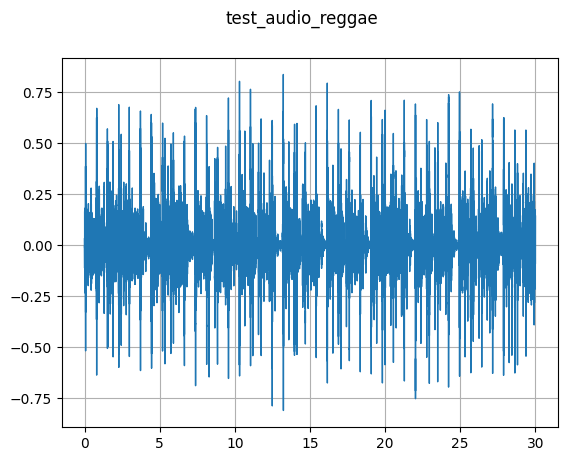

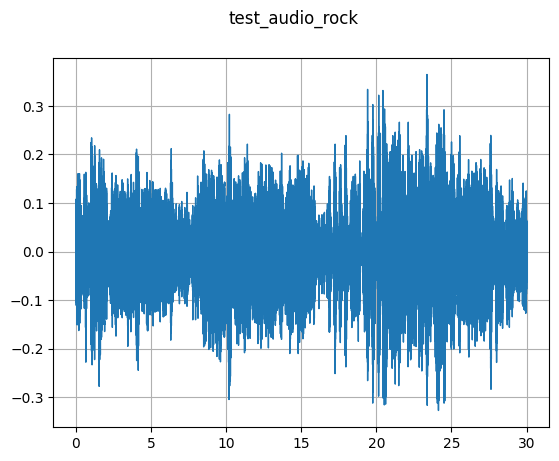

In [12]:
for i in range(len(test_list)):
    plot_waveform(test_list[i][1], test_list[i][2], title=str(test_list[i][0]), xlim=None)
    play_audio(test_list[i][1], test_list[i][2])

In [16]:
import audio_augmentations

AttributeError: 'function' object has no attribute 'func_code'

In [ ]:

transforms = [
    RandomApply([PolarityInversion()], p=0.8),
    RandomApply([Noise(min_snr=0.001, max_snr=0.005)], p=0.3),
    RandomApply([Gain()], p=0.2),
    HighLowPass(sample_rate=sr), # this augmentation will always be applied in this aumgentation chain!
    RandomApply([Delay(sample_rate=sr)], p=0.5),
    RandomApply([PitchShift()], p=0.4),
    RandomApply([Reverb(sample_rate=sr)], p=0.3)
]

In [ ]:
transform = Compose(transforms=transforms)
transformed_audio =  transform(audio)
Audio(transformed_audio, rate=sr)

In [ ]:
transforms = [
    RandomResizedCrop(n_samples=num_samples),
    RandomApply([PolarityInversion(), Noise(min_snr=0.001, max_snr=0.005)], p=0.8),
    RandomApply([Gain()], p=0.2),
    RandomApply([Delay(sample_rate=sr), Reverb(sample_rate=sr)], p=0.5)
]

In [ ]:
transform = Compose(transforms=transforms)
transformed_audio =  transform(audio)
ipd.Audio(transformed_audio, rate=sr)

In [ ]:
transform = ComposeMany(transforms=transforms, num_augmented_samples=4)
transformed_audio_many = transform(audio)
transformed_audio == transformed_audio_many
#transformed_audio.shape = [4, num_channels, num_samples]

tensor([[False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False]])